Entropic Regularization of Optimal Transport
============================================

*Important:* Please read the [installation page](http://gpeyre.github.io/numerical-tours/installation_matlab/) for details about how to install the toolboxes.

This numerical tours exposes the general methodology of regularizing the
optimal transport (OT) linear program using entropy. This allows to
derive fast computation algorithm based on iterative projections
according to a Kulback-Leiber divergence.

In [1]:
from __future__ import division

import numpy as np

import matplotlib.pyplot as plt
import scipy as scp
import pylab as pyl

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%load_ext autoreload
%autoreload 2

### Helpers

In [2]:
"""To compute distance matrix"""
def distmat(x,y):
    
    return np.sum(x**2,0)[:,None] + np.sum(y**2,0)[None,:] - 2*x.transpose().dot(y)

"""To Normalise a vector"""
normalize = lambda a: a/np.sum(a)

"""To Compute P"""
def GetP(u,K,v):
    return u*K*(v.T)

def plotp(x, col,plt, scale=200, edgecolors="k"):
  return plt.scatter(x[0,:], x[1,:], s=scale, edgecolors=edgecolors,  c=col, cmap='plasma', linewidths=2)

In [3]:
N=[400,400]

In [4]:
x=np.random.rand(2,N[0])-0.5
theta =2*np.pi*np.random.rand(1,N[1])
r=0.8+.2*np.random.rand(1,N[1])
y=np.vstack((r*np.cos(theta),r*np.sin(theta)))

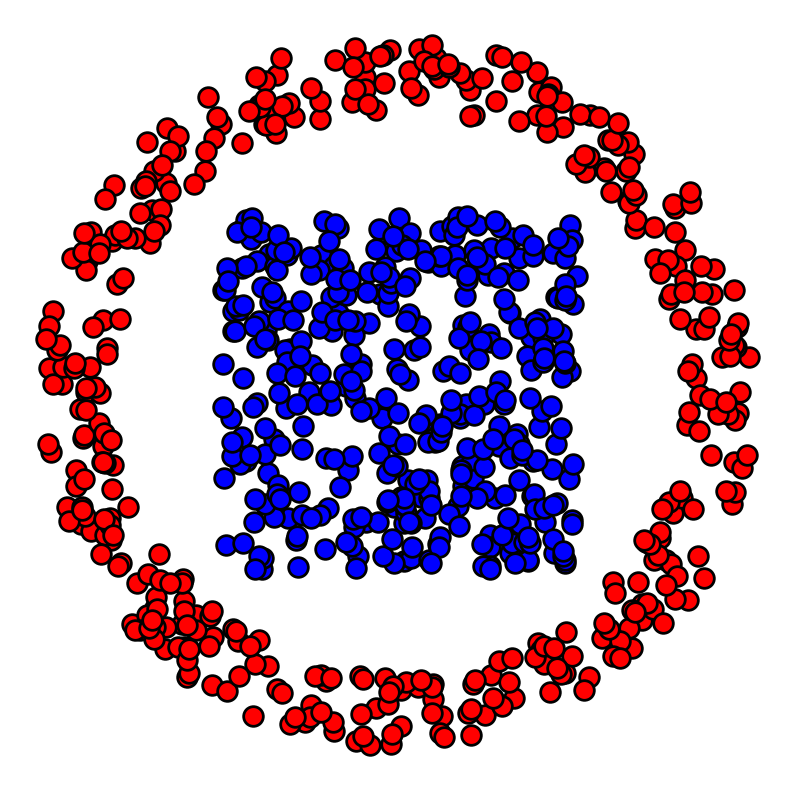

In [5]:

plt.figure(figsize=(10,10))

plotp(x, 'b',plt)
plotp(y, 'r',plt)

plt.axis("off")
plt.xlim(np.min(y[0,:])-.1,np.max(y[0,:])+.1)
plt.ylim(np.min(y[1,:])-.1,np.max(y[1,:])+.1)

plt.show()

In [6]:
C = distmat(x,y)

In [7]:
a = np.ones(N[0])/N[0]
b = np.ones(N[1])/N[1]

In [8]:
import computational_OT

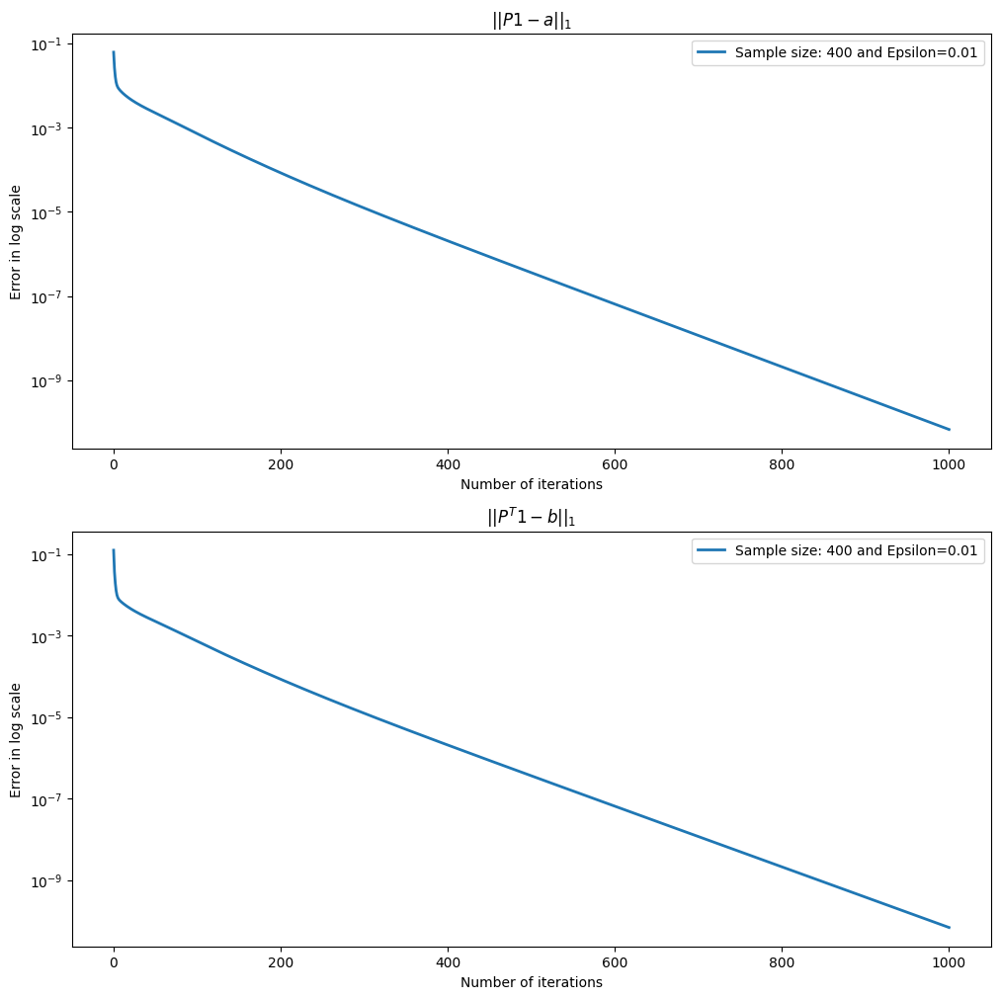

In [9]:
epsilon = .01
K = np.exp(-C/epsilon)
u=np.ones(N[0])
v = np.ones(N[1])



SOptimizer=computational_OT.Sinkhorn(K,a,b,u,v,epsilon)
out=SOptimizer._update(maxiter=1000)
#
# Plot
plt.figure(figsize = (12,12))

plt.subplot(2,1,1),
plt.title("$||P1 -a||_1$")
plt.plot( np.asarray(out[2]), linewidth = 2)
plt.yscale( 'log')
plt.ylabel("Error in log scale")
plt.xlabel("Number of iterations")
plt.legend(["Sample size: "+str(i)+" and Epsilon="+str(epsilon) for i in N],loc="upper right")

plt.subplot(2,1,2)
plt.title("$||P^T 1 -b||_1$")
plt.plot( np.asarray(out[3]), linewidth = 2)
plt.yscale( 'log')
plt.ylabel("Error in log scale")
plt.xlabel("Number of iterations")
plt.legend(["Sample size: "+str(i)+" and Epsilon="+str(epsilon) for i in N],loc="upper right")
plt.show()

In [10]:
epsilon = .01
K = np.exp(-C/epsilon)
u=np.ones(N[0])
v = np.ones(N[1])


SOptimizer=computational_OT.Sinkhorn(K,a,b,u,v,epsilon)
outS=SOptimizer._update(maxiter=100)


X = np.hstack( (outS[0],outS[1]) )
X = epsilon*np.log(X)
NOptimizer=computational_OT.NewtonRaphson(X,K,a,b,epsilon)
outN=NOptimizer._update(maxiter=10, debug=False)

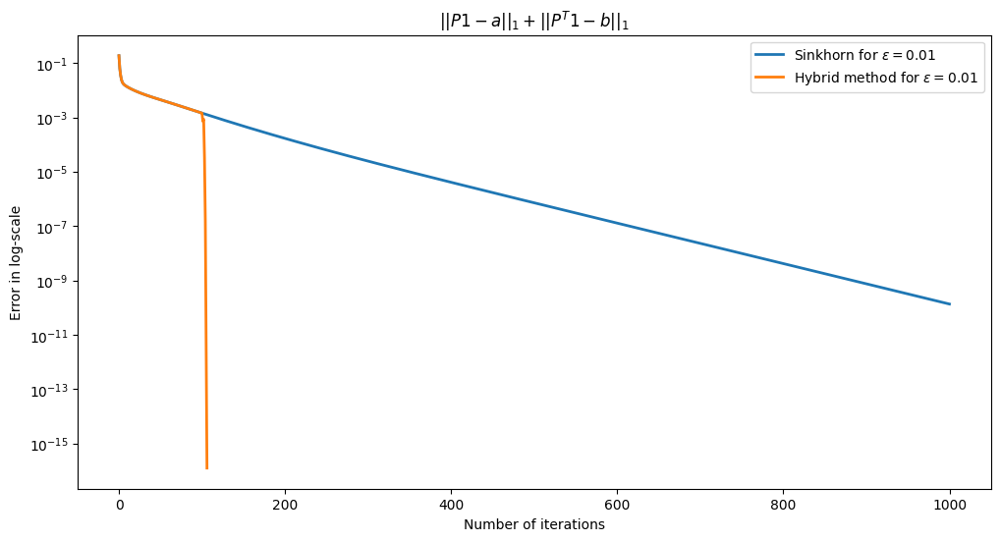

In [11]:
# Plot
plt.figure(figsize = (12,6))

#plt.subplot(2,1,1),
plt.title("$||P1 -a||_1 + ||P^T 1 -b||_1$")
error_sinkhorn = np.asarray(out[2]) + np.asarray(out[3])
error_hybrid   = np.asarray(outS[2]+outN[0]) + np.asarray(outS[3]+outN[1])
plt.plot( error_sinkhorn, label='Sinkhorn for $\epsilon=$' + str(epsilon), linewidth = 2)
plt.plot( error_hybrid,label='Hybrid method for $\epsilon=$'+ str(epsilon), linewidth = 2)
plt.xlabel("Number of iterations")
plt.ylabel("Error in log-scale")
plt.legend()
plt.yscale( 'log')
plt.show()

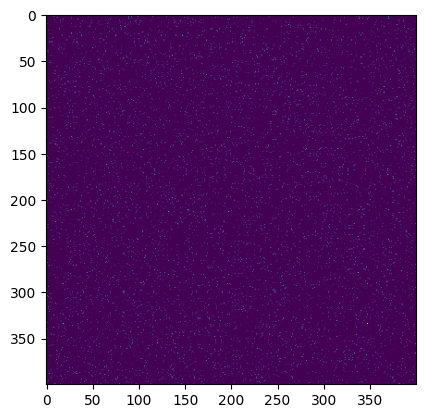

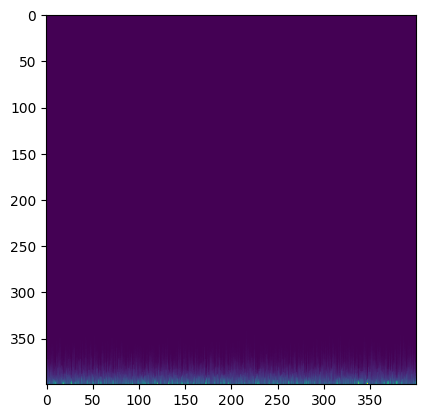

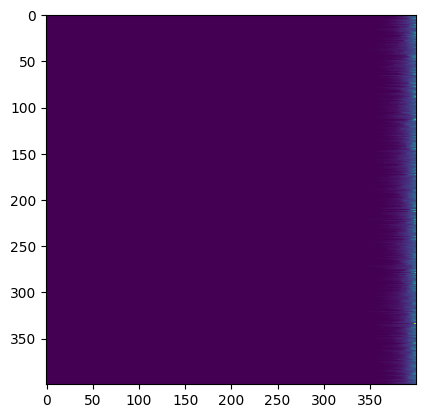

In [12]:
P = np.dot(np.dot(np.diag(outS[0]),K),np.diag(outS[1]))
Q1 = np.sort(P, axis=0)
Q2 = np.sort(P, axis=1)

plt.figure()
plt.imshow(P);
plt.figure()
plt.imshow(Q1);
plt.figure()
plt.imshow(Q2);

## Experiments for different epsilons

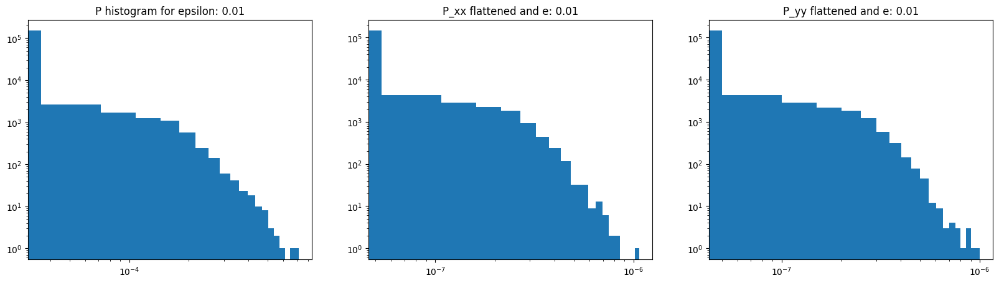

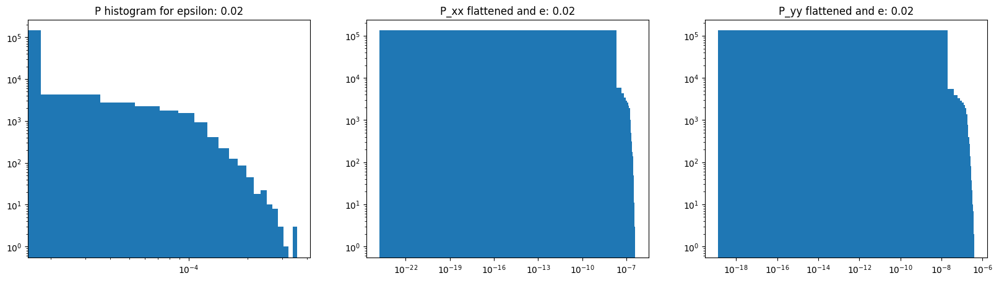

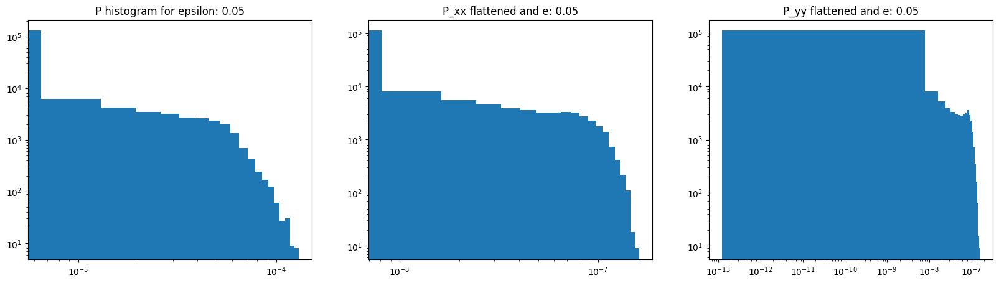

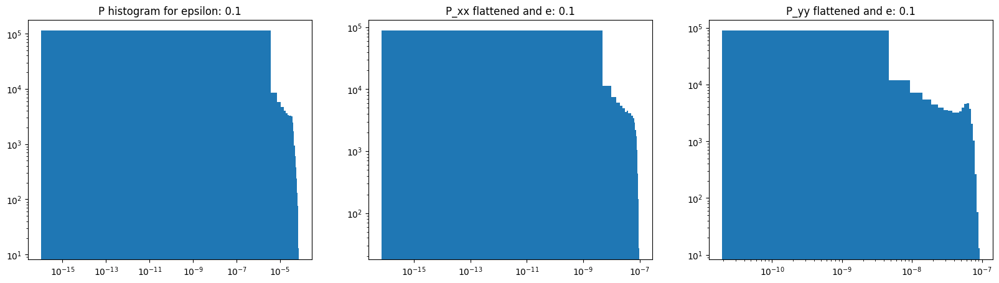

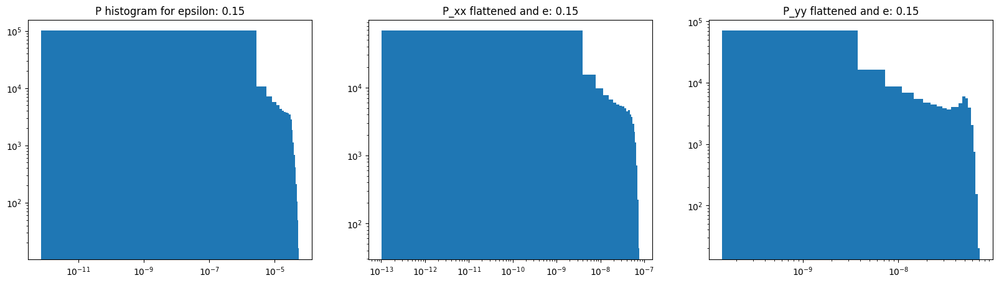

...

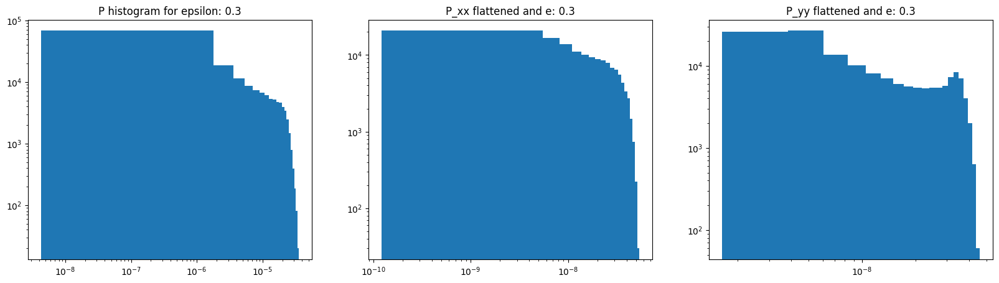

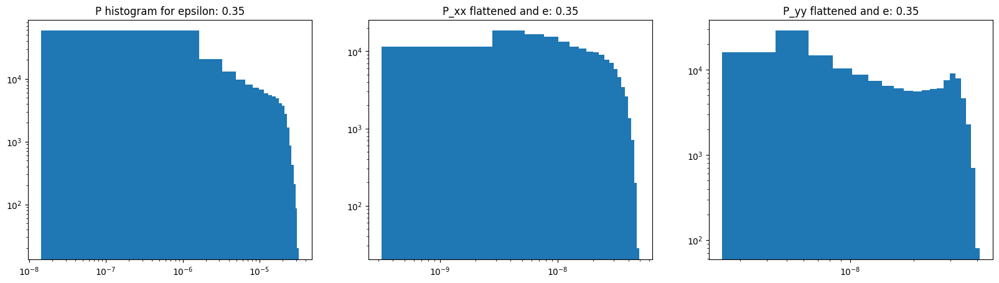

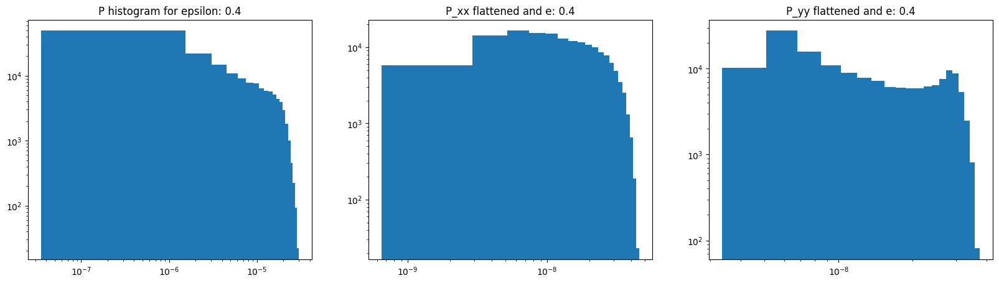

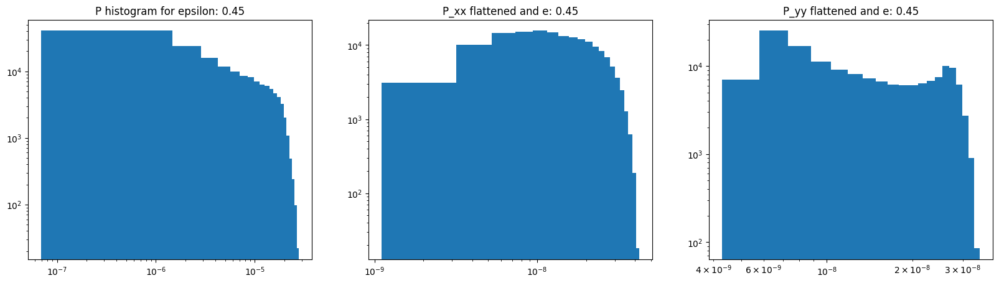

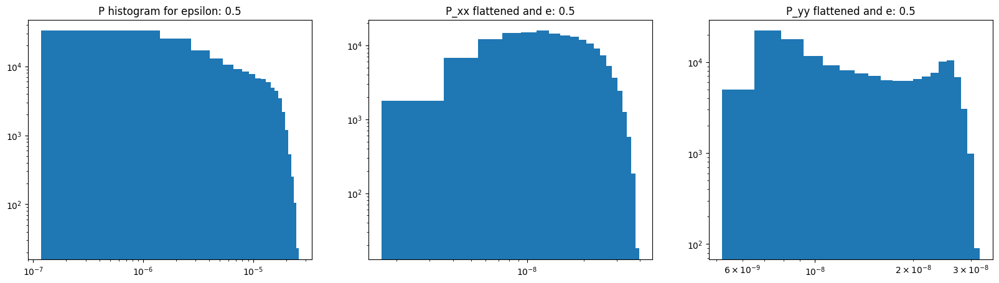

In [13]:
epsilons=[0.01,0.02,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]
n=len(epsilons)
outS={}
outN={}
P={}

for i in range(n):
    K = np.exp(-C/epsilons[i])
    u=np.ones(N[0])
    v=np.ones(N[1])

    SOptimizer=computational_OT.Sinkhorn(K,a,b,u,v,epsilons[i])
    out1=SOptimizer._update(maxiter=1000)
    outS[i]=out1

    X = np.hstack( (outS[i][0],outS[i][1]) )
    X = epsilons[i]*np.log(X)
    NOptimizer=computational_OT.NewtonRaphson(X,K,a,b,epsilons[i])
    out2=NOptimizer._update(maxiter=10, debug=False)
    outN[i]=out2
    
    
    P[i] = np.dot(np.dot(np.diag(out1[0]),K),np.diag(out1[1]))
    P_xx = np.dot(P[i], P[i].T)
    P_yy = np.dot(P[i].T, P[i])
    _,ax=plt.subplots(figsize=(20,5),nrows=1,ncols=3)

    ax[0].set_title("P histogram for epsilon: "+str(epsilons[i]))

    ax[0].hist(P[i].flatten(), 20)
    ax[0].set_xscale("log")
    ax[0].set_yscale("log")
    ax[1].set_title("P_xx flattened and e: "+str(epsilons[i]))
    ax[1].hist( P_xx.flatten(), 20, cumulative=False)
    ax[1].set_xscale("log")
    ax[1].set_yscale("log")
    
    ax[2].set_title("P_yy flattened and e: "+str(epsilons[i]))
    ax[2].hist( P_yy.flatten(), 20, cumulative=False)
    ax[2].set_xscale("log")
    ax[2].set_yscale("log")
    plt.show()
    print("\n \n")
    

### Compute the cutoffs

In [14]:
q=0.8
cutoff_x=[]
cutoff_y=[]
for i in range(n):
    cutoff_x.append(np.quantile(np.dot(P[0],P[0].T).flatten(),q))
    cutoff_y.append(np.quantile(np.dot(P[0].T,P[0]).flatten(),q))


## Cuthill Mckee

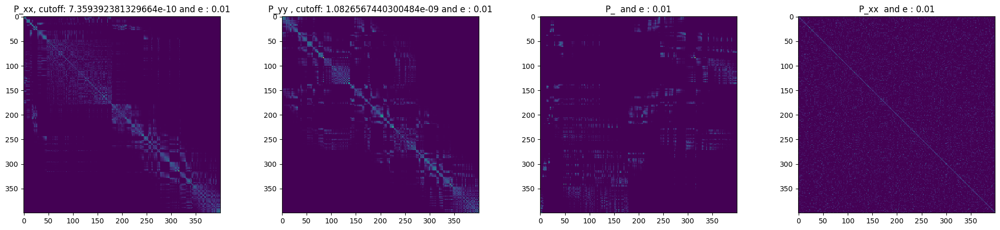

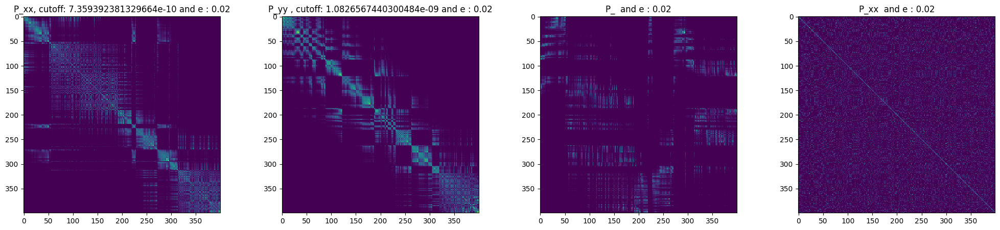

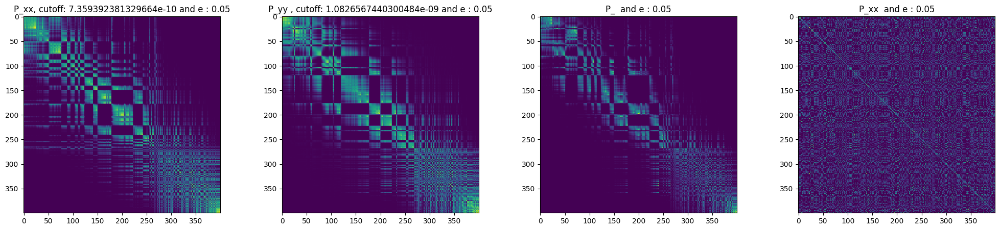

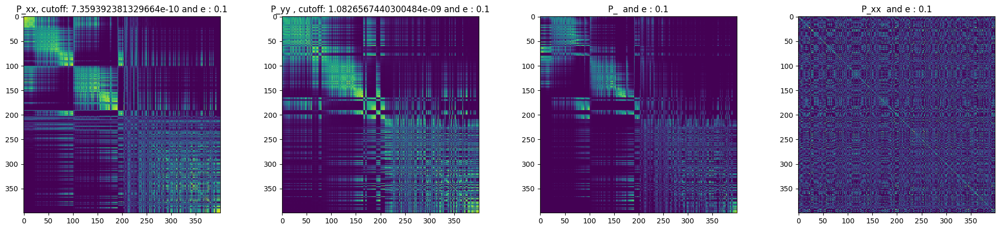

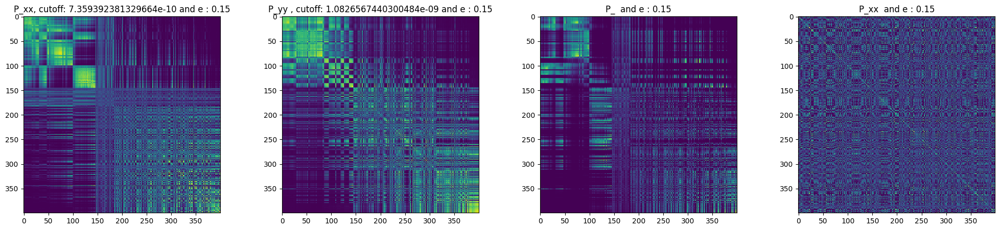

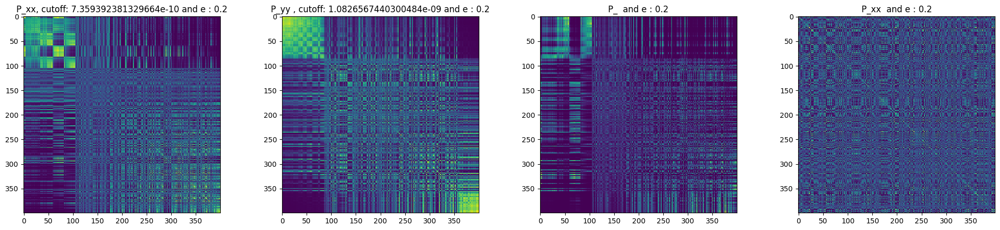

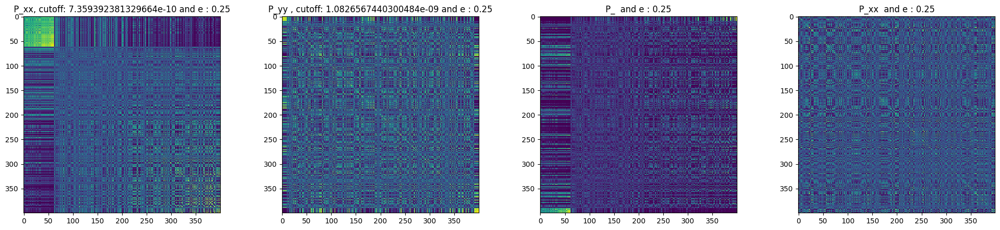

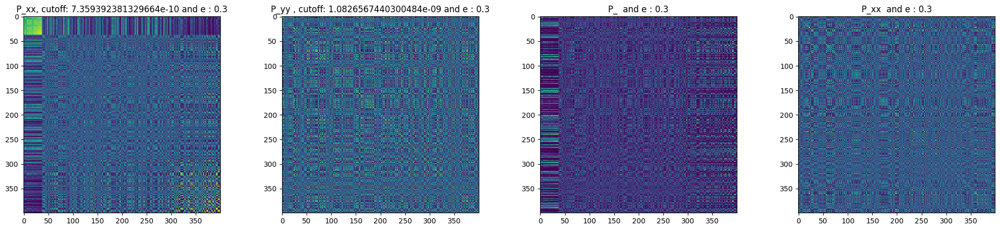

In [15]:
for i in range(n):
    CuthillMckee=computational_OT._Expcuthill_mckee(P[i])
    CuthillMckee._evaluate(cut_offx=cutoff_x[i],cut_offy=cutoff_y[i],epsilon=epsilons[i])


## Errors for different epsilons

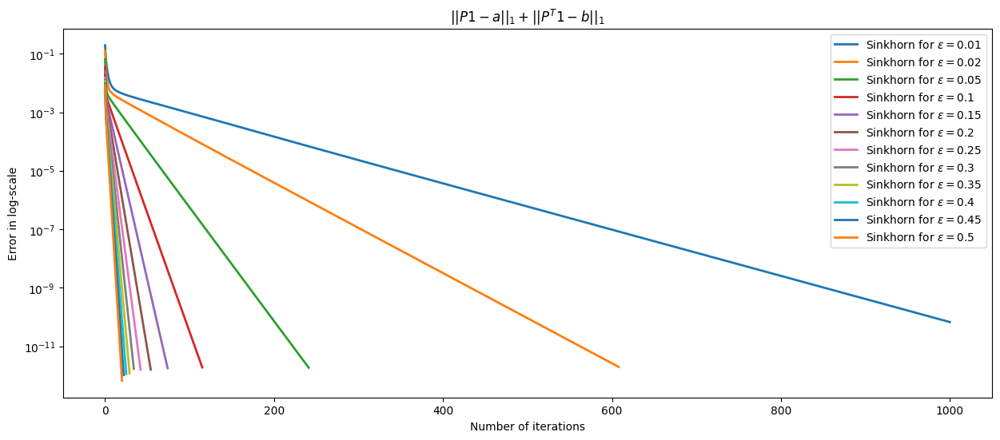

In [ ]:
# Plot
plt.figure(figsize = (15,6))

#plt.subplot(2,1,1),
plt.title("$||P1 -a||_1 + ||P^T 1 -b||_1$")
for i in range(n):
    error_hybrid   = np.asarray(outS[i][2]) + np.asarray(outS[i][3])
    plt.plot( error_hybrid,label='Sinkhorn for $\epsilon=$'+ str(epsilons[i]), linewidth = 2)

plt.xlabel("Number of iterations")
plt.ylabel("Error in log-scale")
plt.legend()
plt.yscale( 'log')
plt.show()

### ANNULUS

In [ ]:
N=[400,400]

### Sampled Annulus

In [ ]:
random = 0.05*np.random.normal(size=N[0])
random2 = np.floor(3*np.random.uniform(size=N[0]))/3
biased_unif = (random + random2) % 1
theta   = 2*np.pi*biased_unif
r=1.0
x=np.vstack((np.cos(theta)*r,np.sin(theta)*r))

### Rotated Annulus

In [ ]:
y=np.vstack((np.cos(theta+(np.pi/2))*r,np.sin(theta+(np.pi/2))*r))


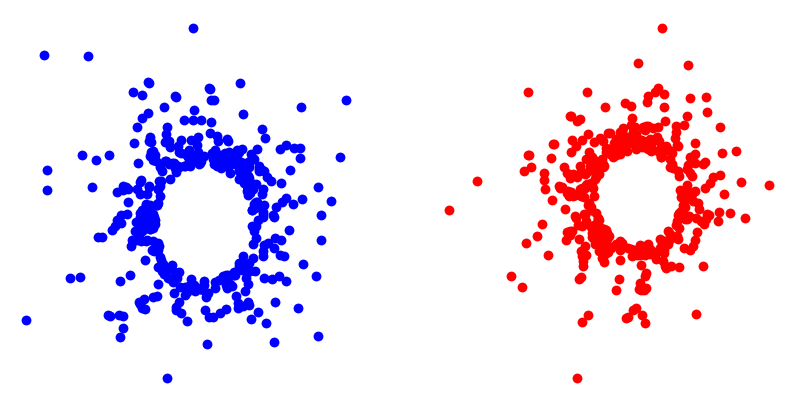

In [ ]:
_,ax=plt.subplots(figsize=(10,5),nrows=1,ncols=2)

plotp(x, 'b',ax[0],scale=50, edgecolors=(0,0,0,0))
plotp(y, 'r',ax[1],scale=50, edgecolors=(0,0,0,0))

ax[0].axis("off")
ax[1].axis("off")

# ax[0].xlim(np.min(x[0,:])-.1,np.max(x[0,:])+.1)
# ax[1].ylim(np.min(y[1,:])-.1,np.max(y[1,:])+.1)

plt.show()

In [ ]:
C = distmat(x,y)

# a and b
a = normalize(np.ones(N[0]))
a=a.reshape(a.shape[0],-1)
b = normalize(np.ones(N[1]))
b=b.reshape(b.shape[0],-1)

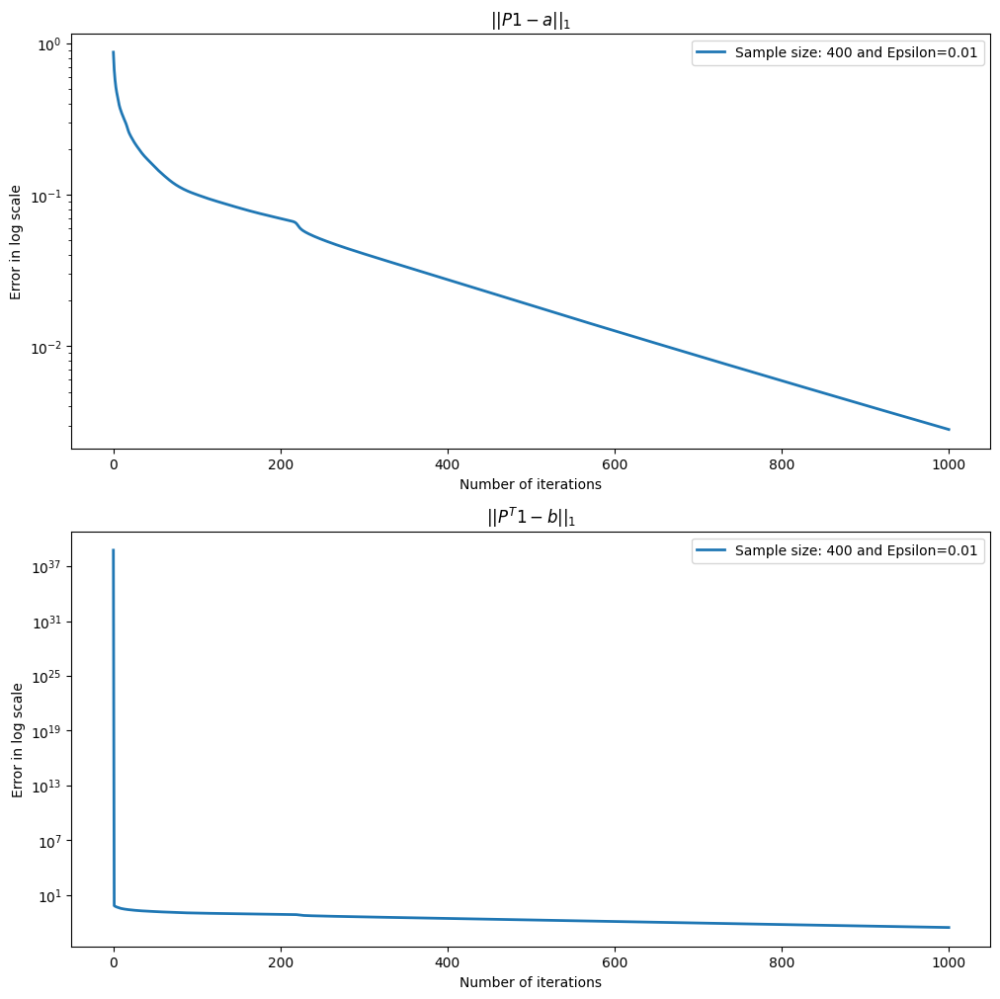

In [ ]:
epsilon = .05
K = np.exp(-C/epsilon)
u=np.ones(N[0])
v = np.ones(N[1])


SOptimizer=computational_OT.Sinkhorn(K,a,b,u,v,epsilon)
outS=SOptimizer._update(maxiter=1000)


# Plot
plt.figure(figsize = (12,12))

plt.subplot(2,1,1),
plt.title("$||P1 -a||_1$")
plt.plot( np.asarray(outS[2]), linewidth = 2)
plt.yscale('log')
plt.ylabel("Error in log scale")
plt.xlabel("Number of iterations")
plt.legend(["Sample size: "+str(i)+" and Epsilon="+str(epsilon) for i in N],loc="upper right")

plt.subplot(2,1,2)
plt.title("$||P^T 1 -b||_1$")
plt.plot( np.asarray(outS[3]), linewidth = 2)
plt.yscale('log')
plt.ylabel("Error in log scale")
plt.xlabel("Number of iterations")
plt.legend(["Sample size: "+str(i)+" and Epsilon="+str(epsilon) for i in N],loc="upper right")
plt.show()

In [ ]:
P = outS[0]*K*(outS[1].T)

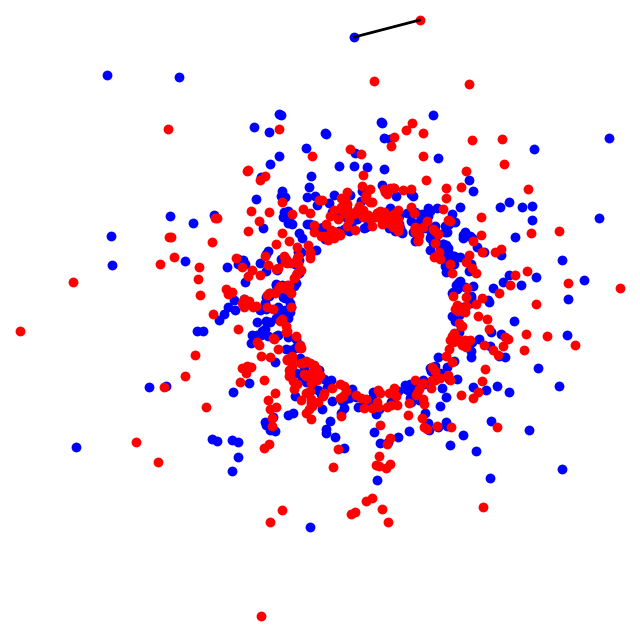

In [ ]:
plt.figure(figsize=(8,8))

plotp(x, 'b',plt,scale=50, edgecolors=(0,0,0,0))
plotp(y, 'r',plt,scale=50, edgecolors=(0,0,0,0))


A = P * (P > np.max(P)*.01)
i,j = np.where(A != 0)
plt.plot([x[0,i],y[0,j]],[x[1,i],y[1,j]],'k',lw = 2)


A = P * (np.max(P)*.5 > P)* (P > np.max(P)*.1)
i,j = np.where(A != 0)
plt.plot([x[0,i],y[0,j]],[x[1,i],y[1,j]],'g',lw = 0.1)

plt.axis("off")
plt.xlim(np.min(y[0,:])-.1,np.max(y[0,:])+.1)
plt.ylim(np.min(y[1,:])-.1,np.max(y[1,:])+.1)

plt.show()